<a href="https://colab.research.google.com/github/nabilafatika/Image-Detection-and-Image-Processing/blob/main/Image_Detection_%26_Image_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Image Detection**
Object detection is a technology that falls under the broader domain of Computer Vision. This method is concerned with identifying and tracking objects present in images and videos. Object detection has many applications such as face detection, vehicle detection, pedestrian counting, autonomous vehicles, security systems, etc.

The two main objectives of object detection include:
• To identify all objects present in an image
• Filtering objects

**TensorFlow**

In [1]:
pip install tensorflow

**PyTorch**

In [2]:
pip install torch torchvision

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [3]:
import torch
import torchvision
from torchvision import transforms as T

from PIL import Image
import cv2
from google.colab.patches import cv2_imshow

In [4]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained = True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 117MB/s]


In [5]:
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [6]:
input_path = "image2.jpg"

In [7]:
ig = Image.open("/content/imagee2.jpg")

In [8]:
transform = T.ToTensor()
img = transform(ig)

In [9]:
with torch.no_grad():
  pred = model([img])

In [10]:
pred

[{'boxes': tensor([[1.0362e+02, 3.0296e+02, 1.4233e+02, 4.0046e+02],
          [4.5322e+02, 3.1322e+02, 5.3733e+02, 3.8451e+02],
          [5.2767e+02, 4.4812e+02, 7.3813e+02, 6.6181e+02],
          [6.2720e+02, 3.5463e+02, 7.3402e+02, 4.5706e+02],
          [8.0076e+02, 4.5565e+02, 1.0237e+03, 6.2618e+02],
          [3.1541e+02, 2.6605e+02, 3.3500e+02, 3.2291e+02],
          [8.7056e+02, 3.7427e+02, 1.0714e+03, 5.0802e+02],
          [5.1558e-01, 3.3333e+02, 3.9218e+01, 3.7025e+02],
          [5.9893e+02, 3.1188e+02, 6.6358e+02, 3.7105e+02],
          [6.8882e+02, 2.8344e+02, 7.3828e+02, 3.2597e+02],
          [8.3976e+02, 3.1170e+02, 8.8441e+02, 3.5327e+02],
          [2.5389e+02, 2.5810e+02, 2.7178e+02, 3.1919e+02],
          [3.4175e+02, 2.8549e+02, 4.1479e+02, 3.3931e+02],
          [6.5273e+01, 5.5927e-01, 1.3352e+02, 8.4243e+01],
          [9.2820e+02, 1.8088e+02, 1.0871e+03, 3.7927e+02],
          [6.4920e+02, 2.4587e+02, 6.7711e+02, 2.7859e+02],
          [2.9021e+02, 2.6219e+

In [11]:
type(pred)

list

In [12]:
len(pred)

1

In [13]:
pred[0].keys()

dict_keys(['boxes', 'labels', 'scores'])

In [14]:
bboxes, labels, scores = pred[0]["boxes"], pred[0]["labels"], pred[0]["scores"]

In [15]:
scores

tensor([0.9981, 0.9968, 0.9966, 0.9963, 0.9918, 0.9595, 0.9473, 0.9366, 0.9137,
        0.9083, 0.9026, 0.8984, 0.8799, 0.8524, 0.8488, 0.8399, 0.8088, 0.7983,
        0.7549, 0.7548, 0.7500, 0.7450, 0.7307, 0.6870, 0.6845, 0.6795, 0.6568,
        0.6514, 0.6223, 0.5910, 0.5779, 0.5082, 0.4980, 0.4731, 0.4322, 0.4255,
        0.4153, 0.4040, 0.4040, 0.4018, 0.3999, 0.3733, 0.3626, 0.3578, 0.3465,
        0.3307, 0.3235, 0.3045, 0.2815, 0.2707, 0.2694, 0.2645, 0.2610, 0.2535,
        0.2499, 0.2390, 0.2261, 0.2160, 0.2152, 0.1772, 0.1710, 0.1694, 0.1587,
        0.1430, 0.1426, 0.1344, 0.1197, 0.1195, 0.1163, 0.1108, 0.1100, 0.1084,
        0.1050, 0.1026, 0.1025, 0.1024, 0.0989, 0.0977, 0.0952, 0.0950, 0.0942,
        0.0913, 0.0912, 0.0902, 0.0879, 0.0875, 0.0860, 0.0843, 0.0804, 0.0787,
        0.0769, 0.0738, 0.0704, 0.0663, 0.0651, 0.0646, 0.0636, 0.0626, 0.0623,
        0.0615])

In [16]:
torch.argwhere(scores > 0.9)

tensor([[ 0],
        [ 1],
        [ 2],
        [ 3],
        [ 4],
        [ 5],
        [ 6],
        [ 7],
        [ 8],
        [ 9],
        [10]])

In [17]:
num = torch.argwhere(scores > 0.9).shape[0]

In [18]:
imagee_names = ["person" ,"bajaj", "car" , "motorcycle" , "airplane" , "bus" , "train" , "truck" , "boat" , "traffic light" , "fire hydrant" , "street sign" , "stop sign" , "parking meter" , "bench" , "bird" , "cat" , "dog" , "horse" , "sheep" , "cow" , "elephant" , "bear" , "zebra" , "giraffe" , "hat" , "backpack" , "umbrella" , "shoe" , "eye glasses" , "handbag" , "tie" , "suitcase" ,
"frisbee" , "skis" , "snowboard" , "sports ball" , "kite" , "baseball bat" ,
"baseball glove" , "skateboard" , "surfboard" , "tennis racket" , "bottle" ,
"plate" , "wine glass" , "cup" , "fork" , "knife" , "spoon" , "bowl" ,
"banana" , "apple" , "sandwich" , "orange" , "broccoli" , "carrot" , "hot dog" ,
"pizza" , "donut" , "cake" , "chair" , "couch" , "potted plant" , "bed" ,
"mirror" , "dining table" , "window" , "desk" , "toilet" , "door" , "tv" ,
"laptop" , "mouse" , "remote" , "keyboard" , "cell phone" , "microwave" ,
"oven" , "toaster" , "sink" , "refrigerator" , "blender" , "book" ,
"clock" , "vase" , "scissors" , "teddy bear" , "hair drier" , "toothbrush" , "hair brush"]

In [19]:
bboxes

tensor([[1.0362e+02, 3.0296e+02, 1.4233e+02, 4.0046e+02],
        [4.5322e+02, 3.1322e+02, 5.3733e+02, 3.8451e+02],
        [5.2767e+02, 4.4812e+02, 7.3813e+02, 6.6181e+02],
        [6.2720e+02, 3.5463e+02, 7.3402e+02, 4.5706e+02],
        [8.0076e+02, 4.5565e+02, 1.0237e+03, 6.2618e+02],
        [3.1541e+02, 2.6605e+02, 3.3500e+02, 3.2291e+02],
        [8.7056e+02, 3.7427e+02, 1.0714e+03, 5.0802e+02],
        [5.1558e-01, 3.3333e+02, 3.9218e+01, 3.7025e+02],
        [5.9893e+02, 3.1188e+02, 6.6358e+02, 3.7105e+02],
        [6.8882e+02, 2.8344e+02, 7.3828e+02, 3.2597e+02],
        [8.3976e+02, 3.1170e+02, 8.8441e+02, 3.5327e+02],
        [2.5389e+02, 2.5810e+02, 2.7178e+02, 3.1919e+02],
        [3.4175e+02, 2.8549e+02, 4.1479e+02, 3.3931e+02],
        [6.5273e+01, 5.5927e-01, 1.3352e+02, 8.4243e+01],
        [9.2820e+02, 1.8088e+02, 1.0871e+03, 3.7927e+02],
        [6.4920e+02, 2.4587e+02, 6.7711e+02, 2.7859e+02],
        [2.9021e+02, 2.6219e+02, 3.1101e+02, 3.2423e+02],
        [6.126

In [20]:
igg = cv2.imread("/content/imagee2.jpg")
for i in range(num):
  x1, y1, x2, y2 = bboxes[i].numpy().astype("int")
  print(x1, y1, x2, y2)
  break

103 302 142 400


In [21]:
labels

tensor([ 1,  3,  3,  3,  3,  1,  3,  3,  3,  3,  3,  1,  3,  1, 64,  3,  1,  3,
         1,  8,  3,  1,  3,  3,  3,  3,  1,  3,  8,  8,  3,  3,  8,  8,  3,  1,
         1,  3,  3,  6,  3,  3,  3,  8,  3,  6,  3,  3,  6,  3,  3,  8,  3,  3,
         1,  3,  8,  3,  8,  6,  8,  1,  3,  8,  3,  3,  8,  1,  8,  3,  1,  3,
         8,  3,  1,  3,  3,  3,  3,  8,  3,  3,  3,  6,  3,  1,  8, 15,  3, 10,
         3, 31,  3,  3,  6,  3,  3,  3,  8,  3])

In [22]:
font = cv2.FONT_HERSHEY_SIMPLEX

In [23]:
igg = cv2.imread("/content/imagee2.jpg")
for i in range(num):
  x1, y1, x2, y2 = bboxes[i].numpy().astype("int")
  class_name = imagee_names[labels.numpy()[i] - 1]
  igg = cv2.rectangle(igg, (x1, y1), (x2, y2), (255, 192, 203), 2)
  igg = cv2.putText(igg, class_name, (x1, y1 - 10), font, 1, (0, 191, 255), 2, cv2.LINE_AA)

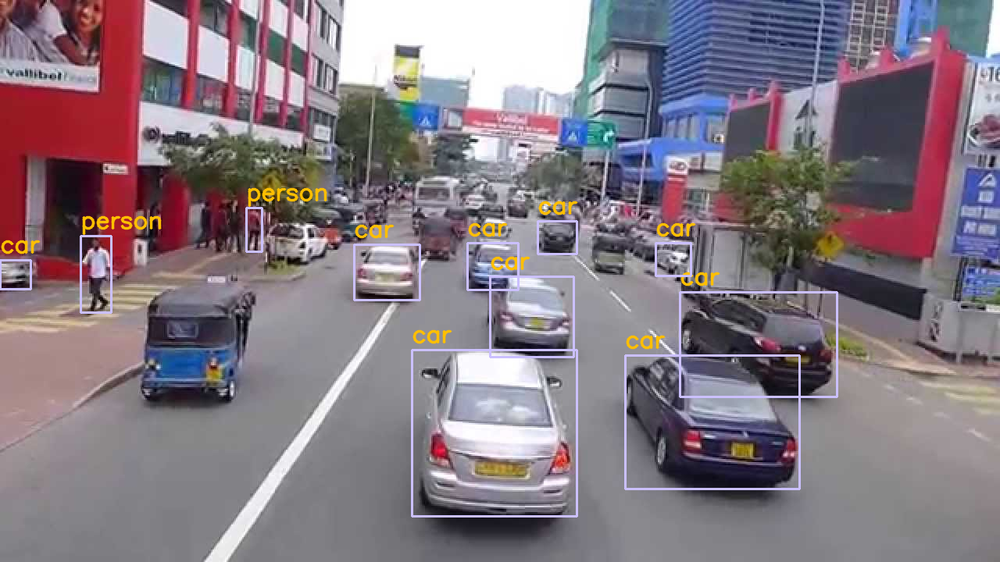

In [24]:
cv2_imshow(igg)

## Image Processing with Python
---
### Import Module

This section contains several mandatory modules used in this notebook: **numpy**, **pandas**, **cv2**, **skimage**, **PIL**, **matplotlib**

*   [Numpy](https://www.numpy.org/) is a library for array manipulation, used for linear algebra, Fourier transformations, and random number capabilities.
*   [Pandas](https://pandas.pydata.org/) is a library for data manipulation and data analysis.
*   [CV2](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_gui/py_image_display/py_image_display.html) is a library for computer vision tasks.
*   [Skimage](https://scikit-image.org/) is a library that supports image processing applications in Python.
*   [Matplotlib](https://matplotlib.org/) is a library that generates images and provides a graphical user interface toolkit.

In [25]:
import numpy as np
import pandas as pd
import cv2 as cv
from skimage import io
from PIL import Image
import matplotlib.pylab as plt

### Read Image from URL
> In this step, we will read an image from a URL and display it using OpenCV. Note the difference when reading images in RGB and BGR formats. The default color channel input format for OpenCV is BGR.

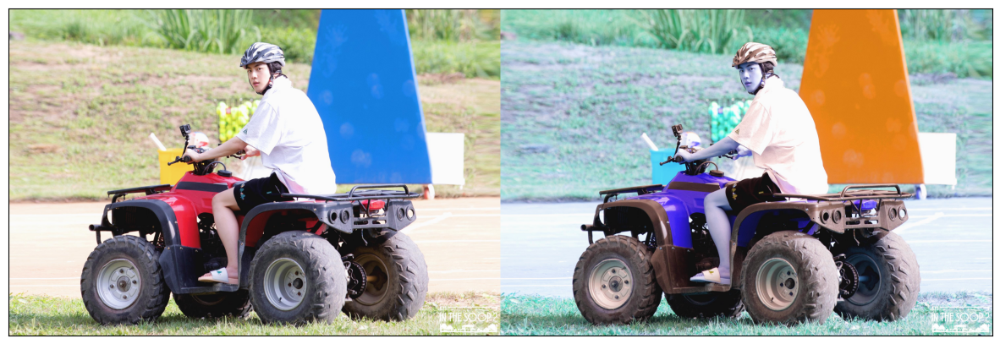

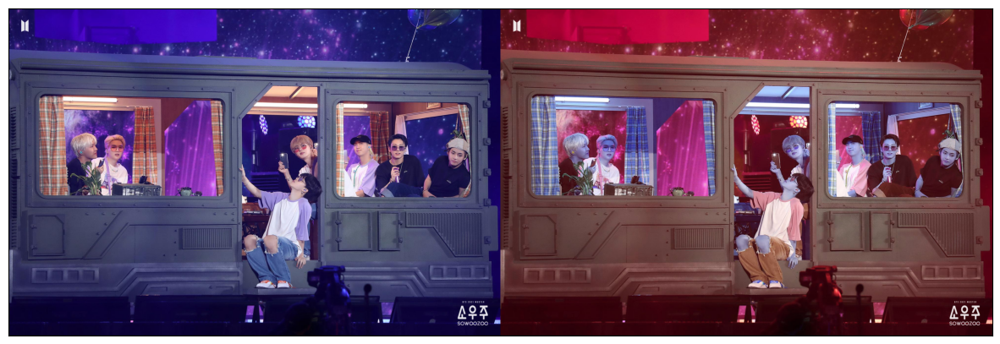

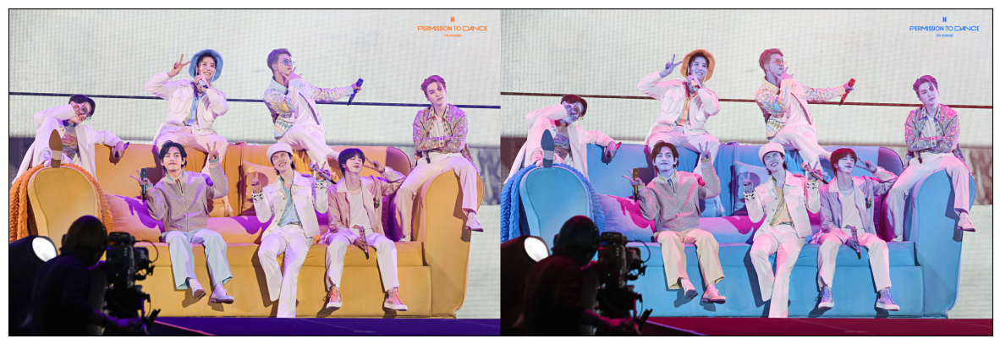

In [26]:
# Create a list to store image URLs
urls = ["image1.jpg",
        "image2.jpg",
        "image3.jpeg"]

# Function to read and display images
def cv_imshow(img):
    plt.figure(figsize=(15, 15))
    plt.imshow(img)
    plt.xticks([]), plt.yticks([])
    plt.show()

# Loop through the image URLs, you can store several image URLs in the list
for url in urls:
    image = io.imread(url)
    image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    final_frame = cv.hconcat((image, image_2))
    cv_imshow(final_frame)

---
### Read the image from the URL and display it
> Search for an image on Google, then use the URL address of that image to perform the operations below by uncommenting the code.

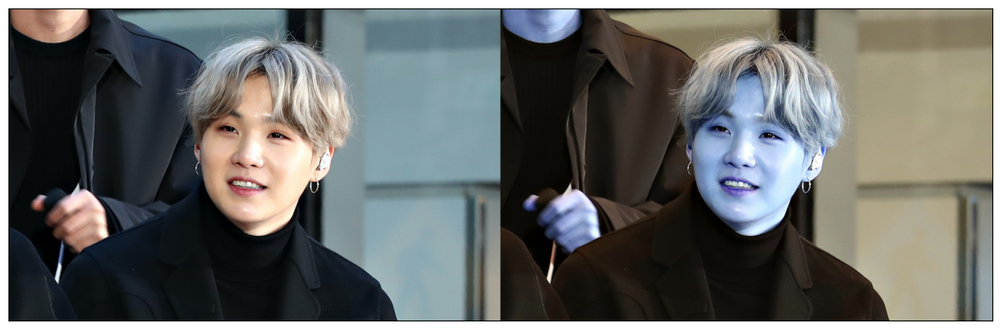

In [27]:
## TODO: LOAD IMAGE FROM URL
url = 'https://www.nme.com/wp-content/uploads/2020/11/GettyImages-1207835842.jpg'
def cv_imshow(img):
    plt.figure(figsize = (15,15))
    plt.imshow(img)
    plt.xticks([]), plt.yticks([])
    plt.show()

myImg = io.imread(url)
myImg2 = cv.cvtColor(myImg, cv.COLOR_BGR2RGB)
final_frame = cv.hconcat((myImg, myImg2))
cv_imshow(final_frame)

---
### Image Contours and Histogram



In [28]:
# Use the image from the first index in the urls variable
image = io.imread(url)

### Generating a Histogram for Color and Grayscale Images
Sometimes you want to enhance the contrast in an image or expand the contrast in a specific region while sacrificing details in less varied or less important colors. A good tool to identify regions of interest is the histogram. To create a histogram from our image data, we use the matplotlib.pylab hist() function.

Displaying the histogram of all pixels in a color image:

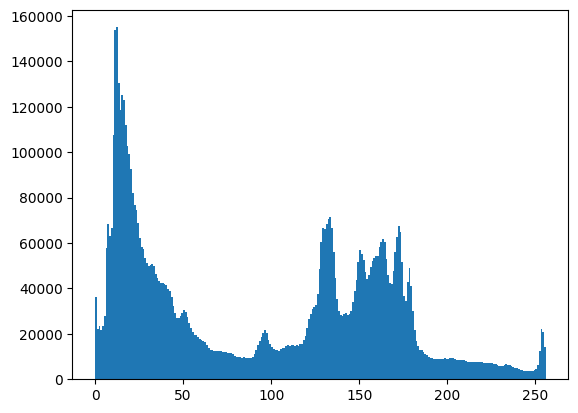

In [29]:
plt.hist(image.ravel(),bins = 256, range = [0,256])
plt.show()

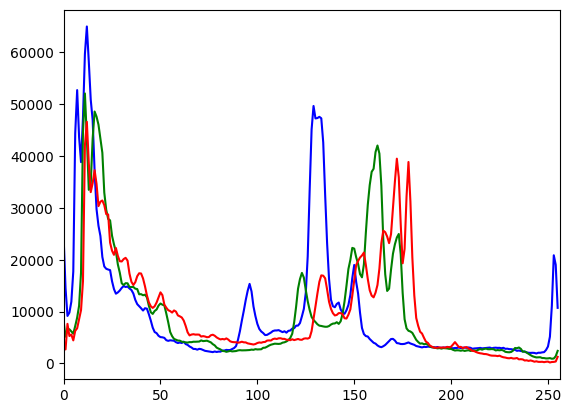

In [30]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv.calcHist([image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

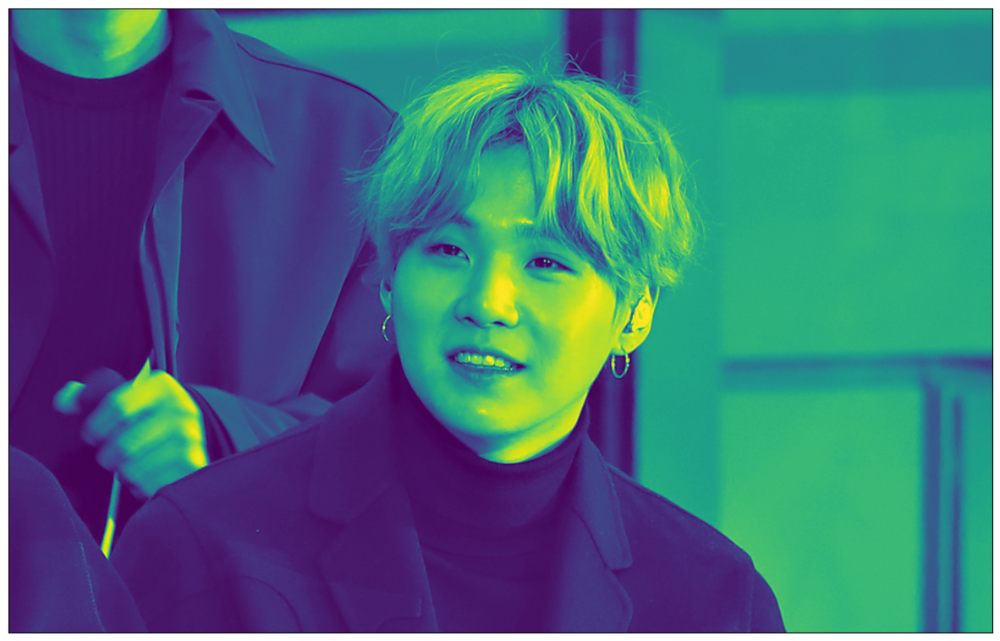

In [31]:
gray_image = cv.cvtColor(myImg, cv.COLOR_BGR2GRAY)
cv_imshow(gray_image)

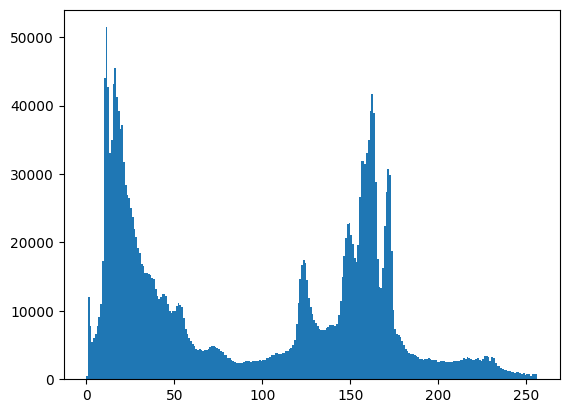

In [32]:
#Plot histogram of the grayscale image.
# We can observe that the histogram frequency of the grayscale image decreases by approximately 1/3 compared to the color image histogram
plt.hist(gray_image.ravel(),bins = 256, range = [0, 256])
plt.show()

---

### Find the contours of the image from the grayscale image
Method 1: Use matplotlib.contour

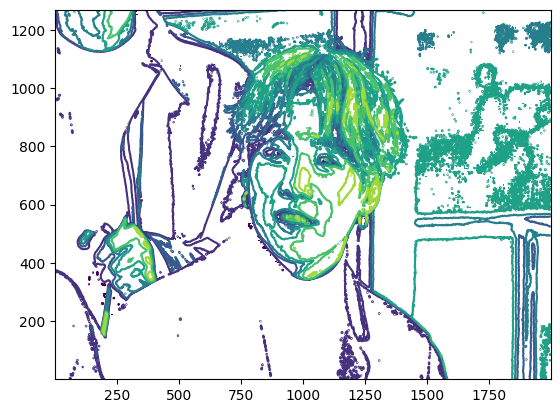

In [33]:
plt.contour(gray_image, origin = "image")

Method 2: Use the OpenCV library

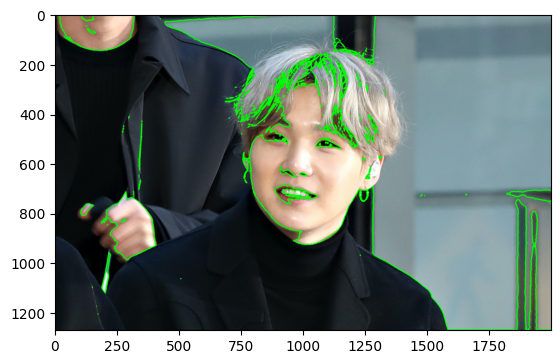

In [34]:
#Set the threshold value for contour detection
ret, thresh = cv.threshold(gray_image,100,200,0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(image, contours, -1, (0, 255, 0), 3)
plt.imshow(image)

---
### Grayscale Transformation and Histogram Equalization

### Grayscale Transformation

This section provides some examples of performing mathematical transformations on grayscale images.

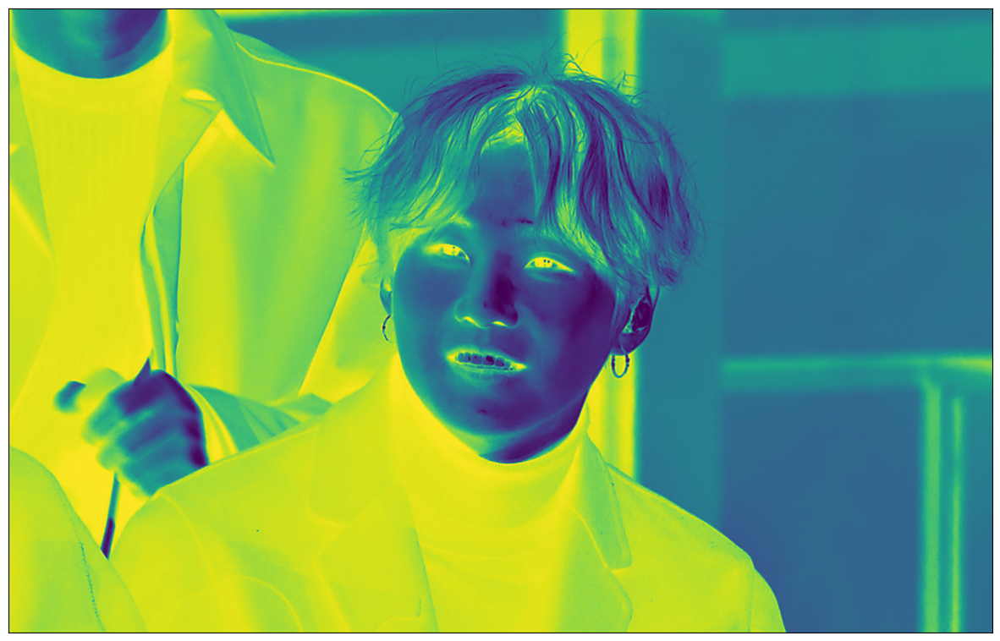

In [35]:
# This is the inverse operation of the grayscale image,
# You can see that bright pixels become dark, and dark pixels become bright
im2 = 255 - gray_image
cv_imshow(im2)

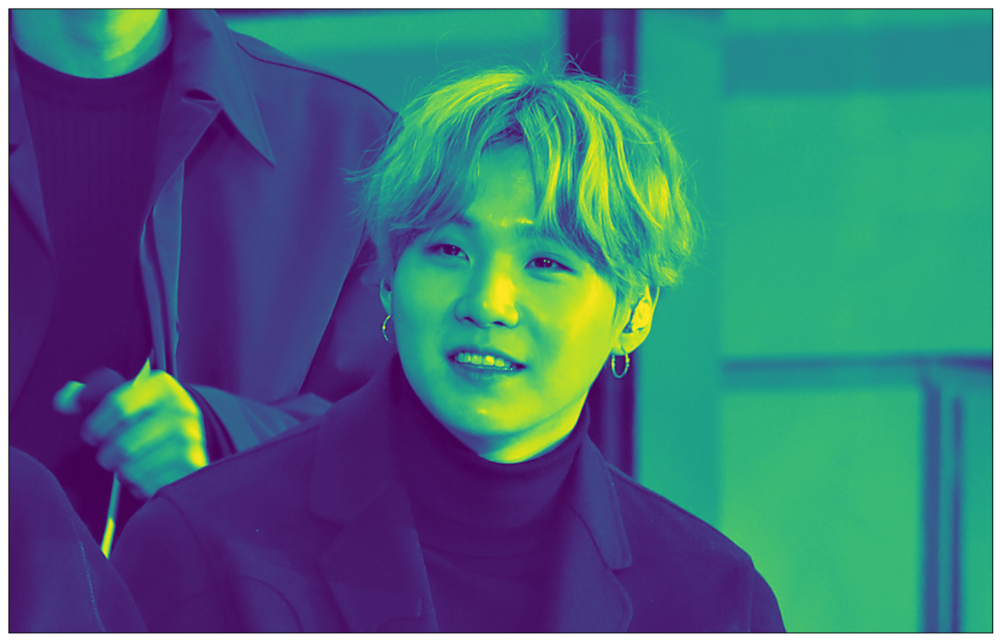

In [36]:
# Another image transformation, after adding a constant,
# all pixels become brighter and a sharpening effect is produced in the image
im3 = (100.0/255)*gray_image + 100
cv_imshow(im3)

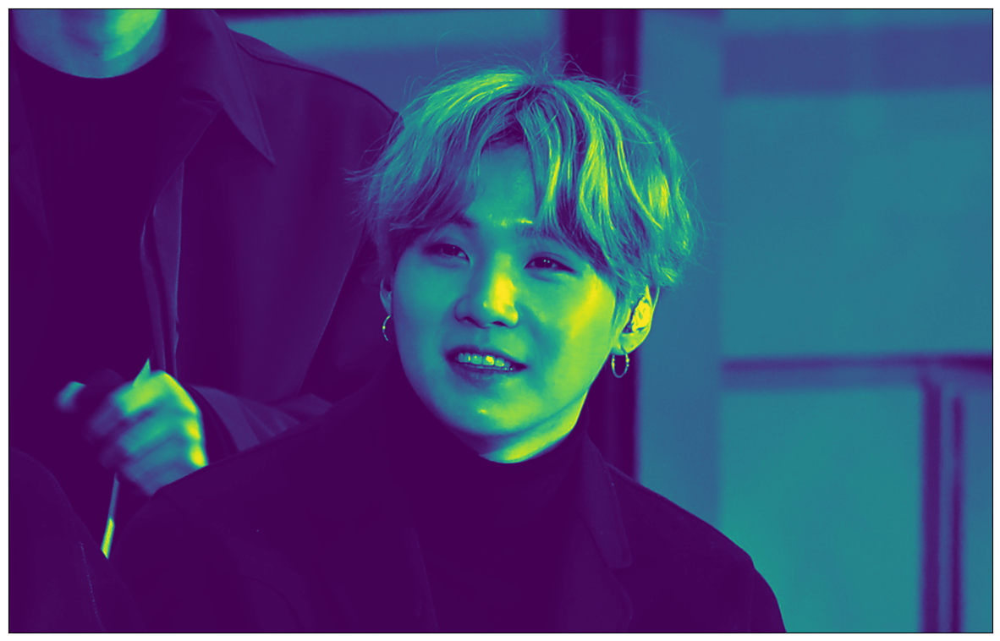

In [37]:
# The brightness level of the grayscale image decreases after this step
im4 = 255.0*(gray_image/255.0)**2
cv_imshow(im4)

---
### Histogram Equalization
This section demonstrates histogram equalization on a dark image. This transformation equalizes the grayscale histogram so that all intensities become as uniform as possible. The transformation function is the cumulative distribution function (CDF) of pixel values in the image (normalized to map the range of pixel values to the desired range). This example uses image 4 (im4)..

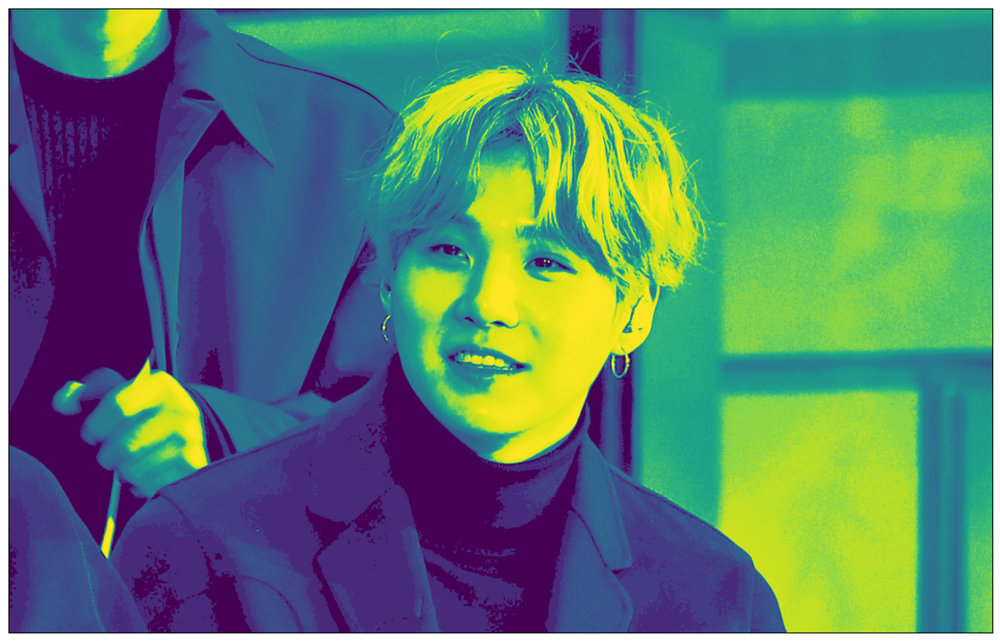

In [38]:
# Function of Histogram Equalization
def histeq(im, nbr_bins = 256):
  """ Persamaan histogram dari citra grayscale.  """
  # Get the histogram of the image
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # Cumulative Distribution Function (CDF) Function
  cdf = imhist.max()*cdf/cdf.max()  #normalization
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]

# Apply the function to your dark image to enhance contrast
# we can observe that the contrast of the black background has increased
im5 = histeq(im4)
cv_imshow(im5)

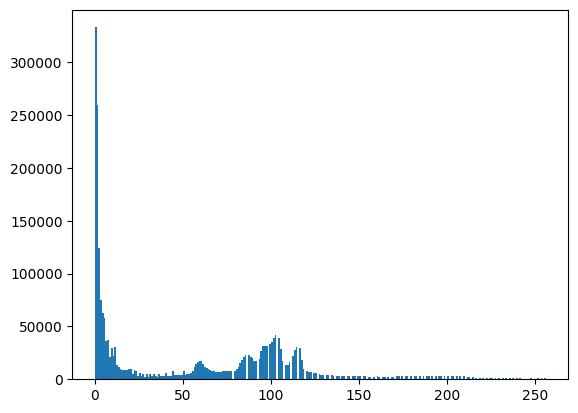

In [39]:
# Extra: trying to visualize the image histogram after histogram equalization
# Before histogram equalization
plt.hist(im4.ravel(),bins = 256, range = [0, 256])
plt.show()

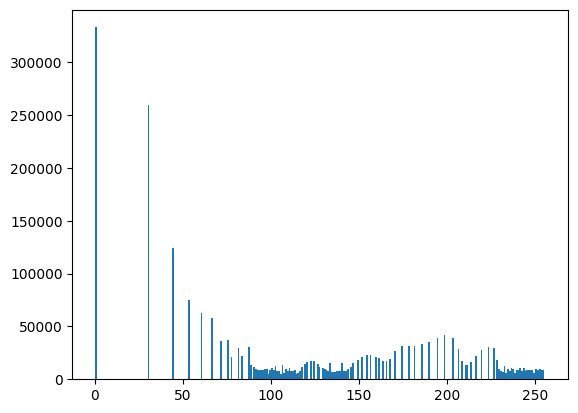

In [40]:
# After histogram equalization
plt.hist(im5.ravel(),bins = 256, range = [0, 256])
plt.show()

---
### Fourier Transformation of Grayscale Image
> Fourier transformation is used to find the frequency domain of an image. You can think of an image as a signal sampled in two directions. So taking the Fourier transformation in both the X and Y directions gives you a representation of the image's frequency. For sinusoidal signals, if the amplitude changes very rapidly over a short period of time, it can be said that it is a high-frequency signal. If it varies slowly, it is a low-frequency signal. Edges and noise are high-frequency content in the image because they change drastically in the image.

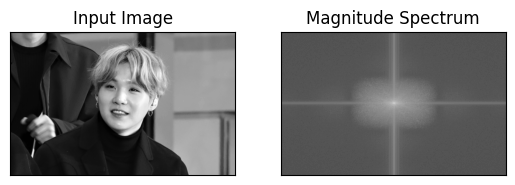

In [41]:
# Blur the grayscale image with a Gaussian filter with a kernel size of 10
imBlur = cv.blur(gray_image,(5,5))
# Convert the image to the frequency domain
f = np.fft.fft2(imBlur)
# Shift the zero frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

---
### Finding Edges with Highpass Filtering in FFT
This section demonstrates performing a high-pass filter to remove low-frequency components, thus resulting in a sharp image containing its edges.


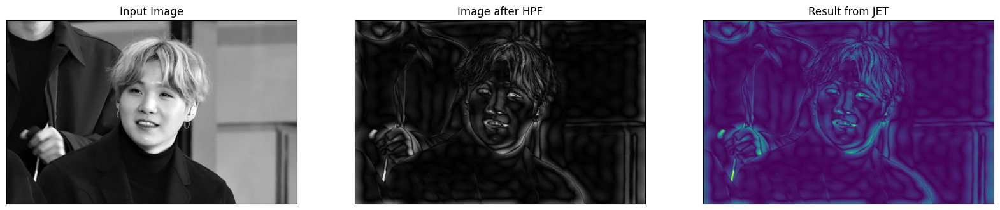

In [42]:
rows, cols = imBlur.shape
crow,ccol = round(rows/2) , round(cols/2)
# Remove low frequencies with a rectangular size of 10.
fshift[crow-10:crow+10, ccol-10:ccol+10] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plt.figure(figsize=([20, 20]))
plt.subplot(131),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back)
plt.title('Result from JET'), plt.xticks([]), plt.yticks([])
plt.show()

This project is part of my coursework for the Artificial Intelligence class during my college years. It focuses on advanced topics in Machine Learning, particularly Image Detection and Image Processing.

Nabila Fatika - 2024